In [ ]:
from google.colab import drive
drive.mount('/gdrive')
drive_root = '/gdrive/My Drive/strykthon'

COLAB_DIR = '/content/data'
GT_DIR = COLAB_DIR + '/data/gtFine/'
IMG_DIR = COLAB_DIR + '/data/leftImg8bit/'

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [ ]:
# import torch

# if not torch.cuda.is_available():
#     print("No GPU device available. Please ensure that a GPU is properly connected and configured.")
#     exit()

In [ ]:
# !pip install cityscapesScripts


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 473.3/473.3 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 9.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 9.1 MB/s eta 0:00:00
  Created wheel for typing: filename=typing-3.7.4.3-py3-none-any.whl size=26306 sha256=7b67cae0a80f9ae8b6afd61c11c7f7d1ed659e1b8e7efc80f8952b9255c17e2b
  Stored in directory: /root/.cache/pip/wheels/7c/d0/9e/1f26ebb66d9e1732e4098bc5a6c2d91f6c9a529838f0284890
Successfully built typing


In [ ]:
from cityscapesscripts.download import downloader

# registration on https://www.cityscapes-dataset.com/
session = downloader.login()
downloader.get_available_packages(session=session)

# data for semantic segmentation task
print('Downloading gtFine and leftImg8bit packages ...\n')
package_list =['gtFine_trainvaltest.zip', 'leftImg8bit_trainvaltest.zip']
downloader.download_packages(session=session, package_names=package_list, destination_path=COLAB_DIR)

In [ ]:
!unzip -q ./data/gtFine_trainvaltest.zip -d gtFine
!unzip -q ./data/leftImg8bit_trainvaltest.zip -d leftImg

replace gtFine/README? [y]es, [n]o, [A]ll, [N]one, [r]ename: N
replace leftImg/README? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
!ls data/

gtFine	gtFine_trainvaltest.zip  leftImg8bit  leftImg8bit_trainvaltest.zip


In [ ]:
from torchvision.datasets import Cityscapes

In [ ]:
from matplotlib import pyplot as plt
from PIL import Image
import numpy as np
import torch
import torch.nn as nn


In [ ]:
dataset=Cityscapes('./data/',split='train',mode='fine',target_type='semantic')

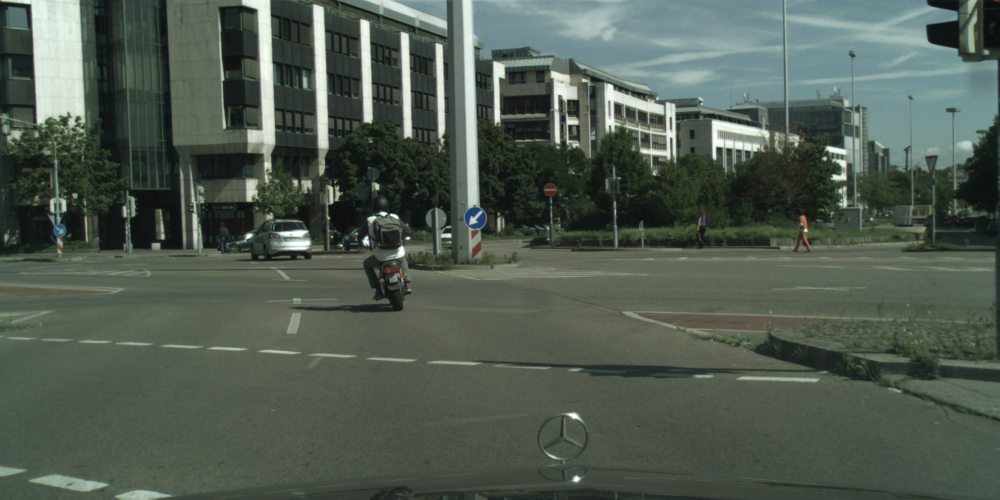

In [ ]:
dataset[0][0]

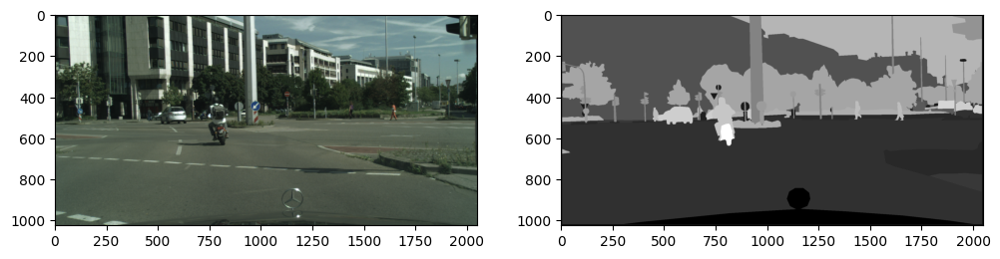

In [ ]:
fig,ax=plt.subplots(ncols=2,figsize=(12,8))
ax[0].imshow(dataset[0][0])
ax[1].imshow(dataset[0][1],cmap='gray')


In [ ]:
ignore_index=255
void_classes = [0, 1, 2, 3, 4, 5, 6, 9, 10, 14, 15, 16, 18, 29, 30, -1]
valid_classes = [ignore_index,7, 8, 11, 12, 13, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 31, 32, 33]
class_names = ['unlabelled', 'road', 'sidewalk', 'building', 'wall', 'fence', 'pole', 'traffic_light', \
               'traffic_sign', 'vegetation', 'terrain', 'sky', 'person', 'rider', 'car', 'truck', 'bus', \
               'train', 'motorcycle', 'bicycle']

class_map = dict(zip(valid_classes, range(len(valid_classes))))
n_classes=len(valid_classes)
class_map

{255: 0,
 7: 1,
 8: 2,
 11: 3,
 12: 4,
 13: 5,
 17: 6,
 19: 7,
 20: 8,
 21: 9,
 22: 10,
 23: 11,
 24: 12,
 25: 13,
 26: 14,
 27: 15,
 28: 16,
 31: 17,
 32: 18,
 33: 19}

In [ ]:
colors = [   [  0,   0,   0],
        [128, 64, 128],
        [244, 35, 232],
        [70, 70, 70],
        [102, 102, 156],
        [190, 153, 153],
        [153, 153, 153],
        [250, 170, 30],
        [220, 220, 0],
        [107, 142, 35],
        [152, 251, 152],
        [0, 130, 180],
        [220, 20, 60],
        [255, 0, 0],
        [0, 0, 142],
        [0, 0, 70],
        [0, 60, 100],
        [0, 80, 100],
        [0, 0, 230],
        [119, 11, 32],
    ]

label_colours = dict(zip(range(n_classes), colors))

In [ ]:
def encode_segmap(mask):
    #remove unwanted classes and recitify the labels of wanted classes
    for _voidc in void_classes:
        mask[mask == _voidc] = ignore_index
    for _validc in valid_classes:
        mask[mask == _validc] = class_map[_validc]
    return mask

In [ ]:
def decode_segmap(temp):
    #convert gray scale to color
    temp=temp.numpy()
    r = temp.copy()
    g = temp.copy()
    b = temp.copy()
    for l in range(0, n_classes):
        r[temp == l] = label_colours[l][0]
        g[temp == l] = label_colours[l][1]
        b[temp == l] = label_colours[l][2]

    rgb = np.zeros((temp.shape[0], temp.shape[1], 3))
    rgb[:, :, 0] = r / 255.0
    rgb[:, :, 1] = g / 255.0
    rgb[:, :, 2] = b / 255.0
    return rgb

In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2
transform=A.Compose(
[
    A.Resize(256, 512),
    A.HorizontalFlip(),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
]
)

In [ ]:
transform = A.Compose([
    # Resize the image and mask to a fixed size
    A.Resize(256, 512),

    # Horizontal flip with a 50% probability
    A.HorizontalFlip(p=0.5),

    # Rotate the image by a random angle between -10 and 10 degrees
    A.Rotate(limit=10, p=0.5),

    # Apply brightness and contrast adjustments randomly
    A.RandomBrightnessContrast(p=0.5),

    # Normalize the image using mean and standard deviation
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),

    # Convert the augmented image and mask to PyTorch tensors
    ToTensorV2(),
])

In [ ]:
from typing import Any, Callable, Dict, List, Optional, Union, Tuple
from torchvision.datasets import Cityscapes

class MyClass(Cityscapes):
    def __getitem__(self, index: int) -> Tuple[Any, Any]:
        image = Image.open(self.images[index]).convert('RGB')

        targets: Any = []
        for i, t in enumerate(self.target_type):
            if t == 'polygon':
                target = self._load_json(self.targets[index][i])
            else:
                target = Image.open(self.targets[index][i])
            targets.append(target)
        target = tuple(targets) if len(targets) > 1 else targets[0]

        if self.transforms is not None:
            transformed=transform(image=np.array(image), mask=np.array(target))
        return transformed['image'],transformed['mask']

In [ ]:
dataset=MyClass('./data/', split='val', mode='fine',
                     target_type='semantic',transforms=transform)
img,seg= dataset[0]
print(img.shape,seg.shape)

torch.Size([3, 256, 512]) torch.Size([256, 512])


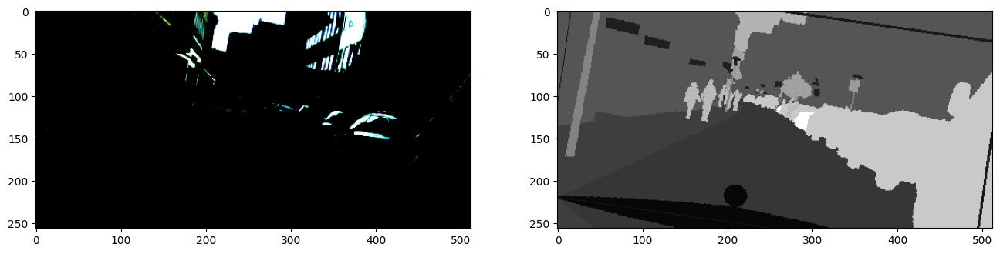

In [ ]:
fig,ax=plt.subplots(ncols=2,nrows=1,figsize=(16,8))
ax[0].imshow(img.permute(1, 2, 0))
ax[1].imshow(seg,cmap='gray')

In [ ]:
#class labels before label correction
print(torch.unique(seg))
print(len(torch.unique(seg)))

tensor([ 0,  1,  3,  4,  7,  8, 11, 17, 20, 21, 23, 24, 25, 26, 33],
       dtype=torch.uint8)
15


In [ ]:
#class labels after label correction
res=encode_segmap(seg.clone())
print(res.shape)
print(torch.unique(res))
print(len(torch.unique(res)))

torch.Size([256, 512])
tensor([ 0,  1,  2,  3,  6,  8,  9, 11, 12, 13, 14, 19], dtype=torch.uint8)
12


In [ ]:
res1=decode_segmap(res.clone())

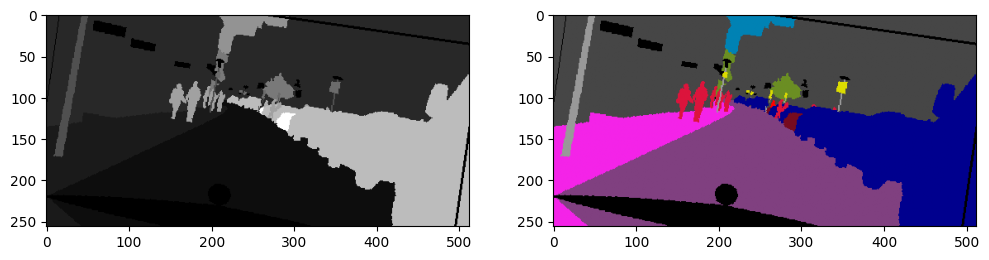

In [ ]:
fig,ax=plt.subplots(ncols=2,figsize=(12,10))
ax[0].imshow(res,cmap='gray')
ax[1].imshow(res1)

In [ ]:
!pip install pytorch-lightning
!pip install segmentation-models-pytorch

from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
from pytorch_lightning.callbacks import EarlyStopping,ModelCheckpoint,LearningRateMonitor
import segmentation_models_pytorch as smp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 801.9/801.9 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 841.5/841.5 kB 44.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-many

In [ ]:
!pip install torchmetrics

In [ ]:
!pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 11.3 MB/s eta 0:00:00
ERROR: Operation cancelled by user
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/base_command.py", line 169, in exc_logging_wrapper
    status = run_func(*args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/req_command.py", line 242, in wrapper
    return func(self, options, args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/commands/install.py", line 377, in run
    requirement_set = resolver.resolve(
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/resolution/resolvelib/resolver.py", line 92, in resolve
    result = self._result = resolver.resolve(
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/resolvelib/resolvers.py", line 546, in resolve
    state = resolution.resolve(requirements, max_rounds=max_rounds

In [ ]:
import multiprocessing
import torch
import segmentation_models_pytorch as smp
from torchmetrics import JaccardIndex
from pytorch_lightning import LightningModule, Trainer
from torch.utils.data import DataLoader
from torch.optim import AdamW

class OurModel(LightningModule):
    def __init__(self):
        super(OurModel, self).__init__()

        # Model architecture: UNet with a ResNet-34 encoder, pretrained on ImageNet
        self.layer = smp.Unet(
            encoder_name="resnet34",
            encoder_weights="imagenet",
            in_channels=3,
            classes=n_classes,
        )

        # Parameters
        self.lr = 1e-3
        self.batch_size = 32
        self.num_workers = multiprocessing.cpu_count() // 4  # Adjust the number of workers

        # Loss and metric
        self.criterion = smp.losses.DiceLoss(mode='multiclass')
        self.metrics = JaccardIndex(num_classes=n_classes, task='multiclass')

        # Define data classes for training and validation
        self.train_class = MyClass(
            './data/', split='train', mode='fine',
            target_type='semantic', transforms=transform
        )
        self.val_class = MyClass(
            './data/', split='val', mode='fine',
            target_type='semantic', transforms=transform
        )

    def process(self, image, segment):
        # Forward pass
        out = self(image)
        segment = encode_segmap(segment)

        # Calculate loss and IoU metric
        loss = self.criterion(out, segment.long())
        iou = self.metrics(out, segment)
        return loss, iou

    def forward(self, x):
        # Forward method
        return self.layer(x)

    def configure_optimizers(self):
        # Optimizer configuration
        opt = AdamW(self.parameters(), lr=self.lr)
        return opt

    def train_dataloader(self):
        # Training data loader
        return DataLoader(
            self.train_class,
            batch_size=self.batch_size,
            shuffle=True,
            num_workers=self.num_workers,
            pin_memory=True,
        )

    def training_step(self, batch, batch_idx):
        # Training step
        image, segment = batch
        loss, iou = self.process(image, segment)
        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log('train_iou', iou, on_step=False, on_epoch=True, prog_bar=False)
        return loss

    def val_dataloader(self):
        # Validation data loader
        return DataLoader(
            self.val_class,
            batch_size=self.batch_size,
            shuffle=False,
            num_workers=self.num_workers,
            pin_memory=True,
        )

    def validation_step(self, batch, batch_idx):
        # Validation step
        image, segment = batch
        loss, iou = self.process(image, segment)
        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=False)
        self.log('val_iou', iou, on_step=False, on_epoch=True, prog_bar=False)
        return loss


In [ ]:
import torchmetrics
model = OurModel()
checkpoint_callback = ModelCheckpoint(monitor='val_loss',dirpath='checkpoints',
                                      filename='file',save_last=True)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 107MB/s]


In [ ]:
from pytorch_lightning import Trainer
trainer = Trainer(max_epochs=10)

trainer.fit(model)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type                   | Params
-----------------------------------------------------
0 | layer     | Unet                   | 24.4 M
1 | criterion | DiceLoss               | 0     
2 | metrics   | MulticlassJaccardIndex | 0     
-----------------------------------------------------
24.4 M    Trainable params
0         Non-trainable params
24.4 M    Total params
97.756    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [ ]:
torch.save(model.state_dict(), 'model.pth')

In [ ]:
model.load_state_dict(torch.load('model_finetunned.pth'))
model.eval()

OurModel(
  (layer): Unet(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchN

In [ ]:
test_class = MyClass('./data/', split='val', mode='fine',
                     target_type='semantic',transforms=transform)
test_loader=DataLoader(test_class, batch_size=12,
                      shuffle=False)

In [ ]:
model=model.cpu()
model.eval()
with torch.no_grad():
    for batch in test_loader:
        img,seg=batch
        output=model(img.cpu())
        break

print(img.shape,seg.shape,output.shape)

torch.Size([12, 3, 256, 512]) torch.Size([12, 256, 512]) torch.Size([12, 20, 256, 512])


In [ ]:
from torchvision import transforms
inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.255]
)

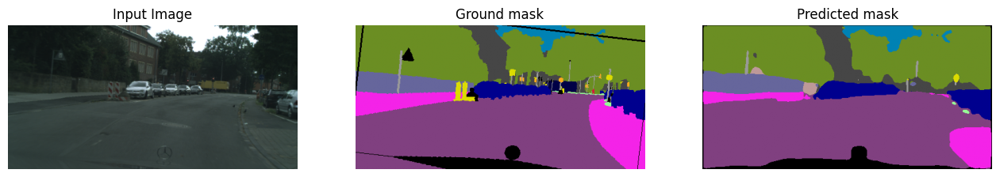

In [ ]:
sample=7
invimg=inv_normalize(img[sample])
outputx=output.detach().cpu()[sample]
encoded_mask=encode_segmap(seg[sample].clone()) #(256, 512)
decoded_mask=decode_segmap(encoded_mask.clone())  #(256, 512)
decoded_ouput=decode_segmap(torch.argmax(outputx,0))
fig,ax=plt.subplots(ncols=3,figsize=(16,50),facecolor='white')
ax[0].imshow(np.moveaxis(invimg.numpy(),0,2)) #(3,256, 512)
#ax[1].imshow(encoded_mask,cmap='gray') #(256, 512)
ax[1].imshow(decoded_mask) #(256, 512, 3)
ax[2].imshow(decoded_ouput) #(256, 512, 3)
ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')
ax[0].set_title('Input Image')
ax[1].set_title('Ground mask')
ax[2].set_title('Predicted mask')
plt.savefig('result.png',bbox_inches='tight')

# Performance Mterics

In [ ]:
import torch
import torch.optim as optim
from torch.autograd import Variable

num_epochs = 2
learning_rate = 0.001
device = torch.device("cpu")  # Define the device

# Assuming you have defined your model and test_loader elsewhere
# Define your optimizer
optimizer = optim.SGD(model.parameters(), lr=learning_rate)

for epoch in range(num_epochs):  # loop over the dataset multiple times

    running_loss = 0
    total_test = 0
    correct_test = 0

    for i, data in enumerate(test_loader, 0):
        # get the inputs
        t_image, mask = data
        t_image, mask = Variable(t_image.to(device)), Variable(mask.long().to(device))  # Convert mask to Long

        # forward pass
        outputs = model(t_image)

        # accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_test += mask.nelement()  # Total number of elements in mask
        correct_test += predicted.eq(mask.data).sum().item()
        test_accuracy = 100 * correct_test / total_test
        print('Epoch {}, Batch {}, Test Accuracy: {:.2f}%'.format(epoch+1, i+1, test_accuracy))


Epoch 1, Batch 1, Test Accuracy: 0.51%
Epoch 1, Batch 2, Test Accuracy: 0.71%
Epoch 1, Batch 3, Test Accuracy: 0.92%
Epoch 1, Batch 4, Test Accuracy: 1.00%
Epoch 1, Batch 5, Test Accuracy: 0.94%
Epoch 1, Batch 6, Test Accuracy: 0.86%
Epoch 1, Batch 7, Test Accuracy: 0.81%


KeyboardInterrupt: 

In [ ]:
# Run inference
model.eval()
iou_scores = np.zeros(n_classes)  # Initialize IoU scores for each class
class_counts = np.zeros(n_classes)  # Initialize class counts to calculate the mean IoU

with torch.no_grad():
    for batch in test_loader:
        img, seg = batch
        output = model(img.cpu())

        # Compute IoU for each class in the batch
        for i in range(len(seg)):
            target = encode_segmap(seg[i].clone())
            outputx = torch.argmax(output[i].cpu(), 0).numpy()
            target_np = target.numpy()  # Convert target tensor to NumPy array
            for class_idx in range(n_classes):
                # Compute intersection and union for the current class
                intersection = np.sum((outputx == class_idx) & (target_np == class_idx))
                union = np.sum((outputx == class_idx) | (target_np == class_idx))
                # Update IoU score for the current class
                iou_scores[class_idx] += intersection / union
                # Update class count
                class_counts[class_idx] += 1

# Calculate mean IoU for each class
mean_iou_per_class = iou_scores / class_counts

# Print IoU scores for each class
for i, class_name in enumerate(class_names):
    print(f"IoU for class {class_name}: {mean_iou_per_class[i]}")

<ipython-input-47-a89504cb0e23>:21: RuntimeWarning: invalid value encountered in scalar divide
  iou_scores[class_idx] += intersection / union


IoU for class unlabelled: 0.573967185959139
IoU for class road: 0.8548753683012748
IoU for class sidewalk: nan
IoU for class building: 0.6401514183953975
IoU for class wall: nan
IoU for class fence: nan
IoU for class pole: 0.21105759713532937
IoU for class traffic_light: nan
IoU for class traffic_sign: nan
IoU for class vegetation: 0.693275666502575
IoU for class terrain: nan
IoU for class sky: nan
IoU for class person: nan
IoU for class rider: nan
IoU for class car: nan
IoU for class truck: nan
IoU for class bus: nan
IoU for class train: nan
IoU for class motorcycle: nan
IoU for class bicycle: nan


# Test Data Automation Script

In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)



Mounted at /content/drive


In [ ]:
!ls /content/drive/MyDrive

 0263BC98-F830-4855-B537-6956ACF85D93.png
 1389F745-47CC-49FB-852F-D226FDD81F60.jpeg
 1963C90C-9B3D-4630-B887-8583FCED7FB5.jpeg
'2022 bce batch.xlsx'
'22BCE 4th sem.xlsx'
 26DCC44E-6178-4CBB-A126-D0E340B23053.jpeg
 4A4B50B2-44CC-4428-A820-981AD5454A9B.png
 9E3DF415-09F1-4A18-B190-5AA9688F9524.png
 Call_Me_by_Your_Name_BookReview_22BCE1148.docx
 EC9937BB-29F7-4B6C-80F2-6D21FE0B6A80.png
'event datasets.zip'
'Exp. Verification of MaximumPower transfer theorem.docx'
 id.pdf
'nptel (1).pdf'
 nptel.pdf
 SIH.gdoc
'Sinusoidal Steady-State Response of RLC.docx'
 sponsor.gdoc
 stryker
 stryker2
 test_data.zip
'Untitled document.gdoc'
'Untitled form.gform'
 Vertika_Singh.jpg


In [ ]:
!unzip -q /content/drive/MyDrive/test_data.zip -d test

In [ ]:
import os
from PIL import Image
import numpy as np
import torch
from torchvision.transforms import functional as F

# Define paths
input_folder = "/content/test/PS1 Test/Images/munster"  # Input folder containing images
output_folder = "/content/results/munster"  # Output folder to save segmented images

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Process each image in the input folder
for filename in os.listdir(input_folder):
    if filename.endswith(".png"):  # Assuming images are PNG format, modify if necessary
        # Load image
        image_path = os.path.join(input_folder, filename)
        image = Image.open(image_path).convert('RGB')

        # Preprocess the image
        transformed = transform(image=np.array(image))
        input_image = transformed['image'].unsqueeze(0)  # Add batch dimension

        # Run inference
        model.eval()
        with torch.no_grad():
            output = model(input_image.cpu())

        # Resize the output to 2048x1024
        output_resized = F.resize(output, (1024, 2048), interpolation=Image.NEAREST)

        # Postprocess the segmentation mask
        output_seg = torch.argmax(output_resized, dim=1).squeeze().cpu()
        decoded_output = decode_segmap(output_seg)

        # Save the predicted image with the same filename
        predicted_image_path = os.path.join(output_folder, filename)
        Image.fromarray((decoded_output * 255).astype(np.uint8)).save(predicted_image_path)

        print(f"Segmentation completed for {filename}.")

print("All images segmented and saved successfully.")


Segmentation completed for munster_000150_000019_leftImg8bit.png.
Segmentation completed for munster_000071_000019_leftImg8bit.png.
Segmentation completed for munster_000003_000019_leftImg8bit.png.
Segmentation completed for munster_000056_000019_leftImg8bit.png.
Segmentation completed for munster_000118_000019_leftImg8bit.png.
Segmentation completed for munster_000095_000019_leftImg8bit.png.
Segmentation completed for munster_000069_000019_leftImg8bit.png.
Segmentation completed for munster_000130_000019_leftImg8bit.png.
Segmentation completed for munster_000026_000019_leftImg8bit.png.
Segmentation completed for munster_000075_000019_leftImg8bit.png.
Segmentation completed for munster_000123_000019_leftImg8bit.png.
Segmentation completed for munster_000031_000019_leftImg8bit.png.
Segmentation completed for munster_000001_000019_leftImg8bit.png.
Segmentation completed for munster_000032_000019_leftImg8bit.png.
Segmentation completed for munster_000106_000019_leftImg8bit.png.
Segmentati

In [ ]:
import os
from PIL import Image

# Define the folder path
folder_path = "/content/results/munster"

# Iterate over each file in the folder
for filename in os.listdir(folder_path):
    if filename.endswith((".jpg", ".jpeg", ".png", ".bmp")):  # Add more extensions if needed
        # Construct the full path to the image file
        image_path = os.path.join(folder_path, filename)

        # Open the image file
        with Image.open(image_path) as img:
            # Get the size of the image
            width, height = img.size
            print(f"Image: {filename}, Size: {width}x{height}")


Image: munster_000150_000019_leftImg8bit.png, Size: 2048x1024
Image: munster_000071_000019_leftImg8bit.png, Size: 2048x1024
Image: munster_000003_000019_leftImg8bit.png, Size: 2048x1024
Image: munster_000056_000019_leftImg8bit.png, Size: 2048x1024
Image: munster_000118_000019_leftImg8bit.png, Size: 2048x1024
Image: munster_000095_000019_leftImg8bit.png, Size: 2048x1024
Image: munster_000069_000019_leftImg8bit.png, Size: 2048x1024
Image: munster_000130_000019_leftImg8bit.png, Size: 2048x1024
Image: munster_000026_000019_leftImg8bit.png, Size: 2048x1024
Image: munster_000075_000019_leftImg8bit.png, Size: 2048x1024
Image: munster_000123_000019_leftImg8bit.png, Size: 2048x1024
Image: munster_000031_000019_leftImg8bit.png, Size: 2048x1024
Image: munster_000001_000019_leftImg8bit.png, Size: 2048x1024
Image: munster_000032_000019_leftImg8bit.png, Size: 2048x1024
Image: munster_000106_000019_leftImg8bit.png, Size: 2048x1024
Image: munster_000005_000019_leftImg8bit.png, Size: 2048x1024
Image: m

In [ ]:
!zip -r results.zip /content/results

  adding: content/results/ (stored 0%)
  adding: content/results/munster/ (stored 0%)
  adding: content/results/munster/munster_000150_000019_leftImg8bit.png (deflated 54%)
  adding: content/results/munster/munster_000071_000019_leftImg8bit.png (deflated 53%)
  adding: content/results/munster/munster_000003_000019_leftImg8bit.png (deflated 43%)
  adding: content/results/munster/munster_000056_000019_leftImg8bit.png (deflated 46%)
  adding: content/results/munster/munster_000118_000019_leftImg8bit.png (deflated 56%)
  adding: content/results/munster/munster_000095_000019_leftImg8bit.png (deflated 45%)
  adding: content/results/munster/munster_000069_000019_leftImg8bit.png (deflated 50%)
  adding: content/results/munster/munster_000130_000019_leftImg8bit.png (deflated 51%)
  adding: content/results/munster/munster_000026_000019_leftImg8bit.png (deflated 36%)
  adding: content/results/munster/munster_000075_000019_leftImg8bit.png (deflated 60%)
  adding: content/results/munster/munster_00

In [ ]:
!pip install tensorboard


In [ ]:
import torch
import torch.nn as nn
import segmentation_models_pytorch as smp
from torchmetrics import JaccardIndex
from pytorch_lightning import LightningModule
from torch.utils.data import DataLoader
from torch.optim import AdamW
from torchvision.datasets import Cityscapes
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.tensorboard import SummaryWriter
import multiprocessing

class OurModel(LightningModule):
    def __init__(self):
        super(OurModel, self).__init__()

        # Model architecture: UNet with a ResNet-34 encoder, pretrained on ImageNet
        self.layer = smp.Unet(
            encoder_name="resnet34",
            encoder_weights="imagenet",
            in_channels=3,
            classes=n_classes,
        )

        # Parameters
        self.lr = 1e-3
        self.batch_size = 32
        self.num_workers = multiprocessing.cpu_count() // 4  # Adjust the number of workers

        # Loss and metric
        self.criterion = smp.losses.DiceLoss(mode='multiclass')
        self.metrics = JaccardIndex(num_classes=n_classes, task='multiclass')

        # Define data classes for training and validation
        self.train_class = MyClass(
            './data/', split='train', mode='fine',
            target_type='semantic', transforms=transform
        )
        self.val_class = MyClass(
            './data/', split='val', mode='fine',
            target_type='semantic', transforms=transform
        )

        # Initialize a TensorBoard writer
        self.writer = SummaryWriter()

    def process(self, image, segment):
        # Forward pass
        out = self(image)
        segment = encode_segmap(segment)

        # Calculate loss and IoU metric
        loss = self.criterion(out, segment.long())
        iou = self.metrics(out, segment)
        return loss, iou

    def forward(self, x):
        # Forward method
        return self.layer(x)

    def configure_optimizers(self):
        # Optimizer configuration
        opt = AdamW(self.parameters(), lr=self.lr)
        return opt

    def train_dataloader(self):
        # Training data loader
        return DataLoader(
            self.train_class,
            batch_size=self.batch_size,
            shuffle=True,
            num_workers=self.num_workers,
            pin_memory=True,
        )

    def training_step(self, batch, batch_idx):
        # Training step
        image, segment = batch
        loss, iou = self.process(image, segment)
        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log('train_iou', iou, on_step=False, on_epoch=True, prog_bar=False)

        # Log the loss to TensorBoard
        self.writer.add_scalar('Loss/train', loss, self.global_step)

        return loss

    def val_dataloader(self):
        # Validation data loader
        return DataLoader(
            self.val_class,
            batch_size=self.batch_size,
            shuffle=False,
            num_workers=self.num_workers,
            pin_memory=True,
        )

    def validation_step(self, batch, batch_idx):
        # Validation step
        image, segment = batch
        loss, iou = self.process(image, segment)
        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=False)
        self.log('val_iou', iou, on_step=False, on_epoch=True, prog_bar=False)

        # Log the loss to TensorBoard
        self.writer.add_scalar('Loss/validation', loss, self.global_step)

        return loss

    def on_epoch_end(self):
        # Called at the end of each epoch
        # Flush the TensorBoard writer
        self.writer.flush()


In [ ]:
# Load TensorBoard extension
%load_ext tensorboard

# Start TensorBoard
%tensorboard --logdir=./lightning_logs


<IPython.core.display.Javascript object>